In [28]:
import sys
sys.path.append('..')
import torch
from torch.utils.data import DataLoader
import torch.nn.functional as F
from utils import commons
from models.mlp import MLPModel
from datasets.sequence_dataset import SingleLabelSequenceDataset
import matplotlib.pyplot as plt
import numpy as np
import os, json
import seaborn as sns
from tqdm.auto import tqdm
from sklearn.manifold import TSNE
from utils.losses import pairwise_cosine_distance
device = 'cuda:0'

def generate_embeddings(model, dataloader, label_list):
    embeddings, labels, preds = [], [], []
    with torch.no_grad():
        for data, label in tqdm(dataloader):
            output, feature = model(data.to(device))
            embeddings.append(commons.toCPU(feature))
            label = label.tolist()
            label = [label_list[i] for i in label]
            labels.extend(label)
            pred = torch.argmax(output, dim=1).tolist()
            pred = [label_list[i] for i in pred]
            preds.extend(pred)
    embeddings = torch.cat(embeddings, dim=0)
    assert len(embeddings) == len(labels)
    return embeddings, labels, preds

def get_ec2occurance(data_file, label_file):
    data = torch.load(data_file)
    with open(label_file, 'r') as f:
        label_list = json.load(f)
    ec2occurance = {label: 0 for label in label_list}
    for k, v in data.items():
        for label in v['ec']:
            ec2occurance[label] += 1
    
    return ec2occurance, label_list

def get_label2mean(embeddings, labels):
    label2embeddings = {label: [] for label in labels}
    assert len(embeddings) == len(labels), f'{len(embeddings)} != {len(labels)}'
    n = len(embeddings)
    for i in range(n):
        label2embeddings[labels[i]].append(embeddings[i])
    label2mean = {label: torch.stack(embeddings).mean(dim=0) for label, embeddings in label2embeddings.items()}
    return label2mean

def get_pairwise_angle(means):
    g_mean = means.mean(dim=0)
    centered_mean = means - g_mean
    means_ = F.normalize(centered_mean, p=2, dim=1)
    cosine = torch.matmul(means_, means_.t())
    angles = torch.acos(cosine)
    for i in range(angles.size(0)):
        angles[i, i] = 0
    
    return angles

model_dir = '../logs_debug/train_mlp_single_label_NC_deeper_2024_03_28__15_42_43_NC_v2_cosine_bs1000'
# model_dir = '../logs_debug/train_mlp_single_label_NC_2024_03_05__15_21_29_no_CE_0.005_0.01'
# model_dir = '../logs_analysis/train_mlp_single_label_NC_2024_03_01__14_42_37_0.0005_0.01'
means = torch.load(os.path.join(model_dir, 'checkpoints/means.pt')).detach().cpu()
print(means.shape)
test_data_file = '../data/ec/sprot_10_1022_esm2_t33_ec_above_10_single_label_test.pt'
train_data_file = '../data/ec/sprot_10_1022_esm2_t33_ec_above_10_single_label_train.pt'
label_file = '../data/ec/swissprot_ec_list_above_10.json'

# dataset
trainset = SingleLabelSequenceDataset(train_data_file, label_file)
train_pids = trainset.pids
testset = SingleLabelSequenceDataset(test_data_file, label_file)
test_pids = testset.pids
train_loader = DataLoader(trainset, batch_size=512, shuffle=False)
test_loader = DataLoader(testset, batch_size=512, shuffle=False)
with open(label_file, 'r') as f:
    label_list = json.load(f)
label2idx = {label: i for i, label in enumerate(label_list)}
ec2occurance, label_list = get_ec2occurance(train_data_file, label_file)
occurance_list = np.array(list(ec2occurance.values()))
print((occurance_list < 10).sum())
# input()

config = commons.load_config(os.path.join(model_dir, 'config.yml'))
model = globals()[config.model.model_type](config.model)
ckpt = torch.load(os.path.join(model_dir, 'checkpoints/best_checkpoints.pt'))
model.load_state_dict(ckpt)
model.eval()
model.to(device)

train_embeddings, train_labels, train_preds = generate_embeddings(model, train_loader, label_list)
test_embeddings, test_labels, test_preds = generate_embeddings(model, test_loader, label_list)
train_label2mean = get_label2mean(train_embeddings, train_labels)
test_label2mean = get_label2mean(test_embeddings, test_labels)

cos_sim = pairwise_cosine_distance(test_embeddings, means)
preds = cos_sim.argmin(dim=1)
test_preds = [label_list[i] for i in preds.tolist()]
print('Test accuracy:', (np.array(test_preds) == np.array(test_labels)).mean())
cos_sim = pairwise_cosine_distance(train_embeddings, means)
preds = cos_sim.argmin(dim=1)
train_preds = [label_list[i] for i in preds.tolist()]
print('Train accuracy:', (np.array(train_preds) == np.array(train_labels)).mean())

torch.Size([1920, 2000])


[2024-04-02 22:07:02,917::SequenceDataset::INFO] Loaded 167108 sequences with ec labels
[2024-04-02 22:07:02,917::SequenceDataset::INFO] Loaded 167108 sequences with ec labels
[2024-04-02 22:07:02,917::SequenceDataset::INFO] Loaded 167108 sequences with ec labels
[2024-04-02 22:07:02,917::SequenceDataset::INFO] Loaded 167108 sequences with ec labels
[2024-04-02 22:07:02,917::SequenceDataset::INFO] Loaded 167108 sequences with ec labels
[2024-04-02 22:07:02,917::SequenceDataset::INFO] Loaded 167108 sequences with ec labels
[2024-04-02 22:07:02,917::SequenceDataset::INFO] Loaded 167108 sequences with ec labels
[2024-04-02 22:07:02,919::SequenceDataset::INFO] Label level: 4; Num of labels: 1920
[2024-04-02 22:07:02,919::SequenceDataset::INFO] Label level: 4; Num of labels: 1920
[2024-04-02 22:07:02,919::SequenceDataset::INFO] Label level: 4; Num of labels: 1920
[2024-04-02 22:07:02,919::SequenceDataset::INFO] Label level: 4; Num of labels: 1920
[2024-04-02 22:07:02,919::SequenceDataset::I

477


  0%|          | 0/327 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

Test accuracy: 0.992675570874623
Train accuracy: 0.9987552959762549


max_angle: 1.7129701375961304, min_angle: 1.567918300628662, std_angle: 0.010320846922695637
torch.Size([1842240])
477 torch.Size([477, 1920])
<10 minor classes: max_angle: 1.7091052532196045, min_angle: 1.567918300628662, std_angle: 0.01031535118818283


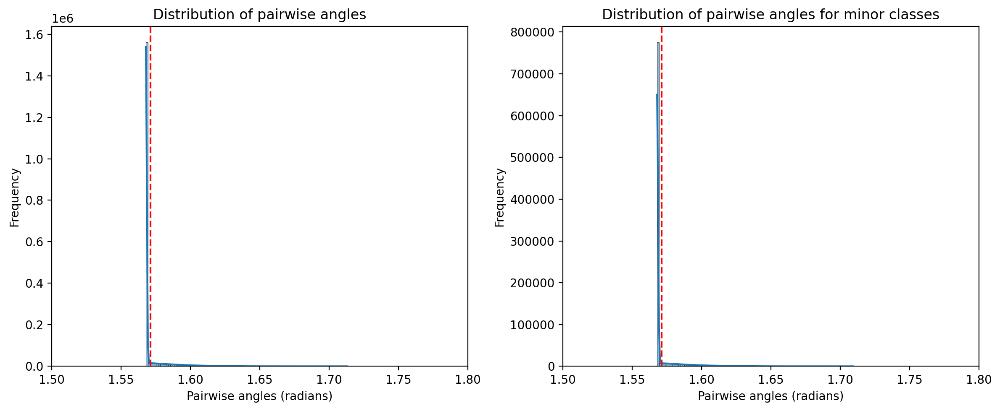

In [7]:
# invesitage the learned means
# about NC2: pairwise angles
import seaborn as sns

def get_upper_triangular_no_diag(tensor):
    upper_triangular_no_diag = torch.triu(tensor, diagonal=1).flatten()
    return upper_triangular_no_diag[upper_triangular_no_diag.nonzero()].squeeze()

angles = get_pairwise_angle(means)
# get the max and min and std of angles while ignoring the diagonal elements
max_angle = torch.max(angles[torch.eye(angles.size(0)) == 0])
min_angle = torch.min(angles[torch.eye(angles.size(0)) == 0])
std_angle = torch.std(angles[torch.eye(angles.size(0)) == 0])
print(f'max_angle: {max_angle}, min_angle: {min_angle}, std_angle: {std_angle}')
# get the upper triangle elements without the diagonal elements and store them in a 1D tensor
angles_flattened = get_upper_triangular_no_diag(angles)
print(angles_flattened.shape)

le10_label_indices = [label2idx[label] for label in label_list if ec2occurance[label] < 10]
le10_angles = angles[le10_label_indices]
print(len(le10_label_indices), le10_angles.shape)
le10_angles_non_zero = le10_angles[le10_angles != 0]
# get the max and min and std of angles while ignoring the zero elements
print(f'<10 minor classes: max_angle: {torch.max(le10_angles_non_zero)}, min_angle: {torch.min(le10_angles_non_zero)}, std_angle: {torch.std(le10_angles_non_zero)}')

# plot the distribution of the pairwise angles
# mark a vertical line at k=torch.acos(-1/1919)
figure, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), dpi=200)
sns.histplot(angles_flattened, ax=axes[0], bins=100, kde=True)
axes[0].axvline(torch.acos(torch.tensor(-1/1919)), color='r', linestyle='--')
axes[0].set_xlabel('Pairwise angles (radians)')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of pairwise angles')
axes[0].set_xlim(1.5, 1.8)

sns.histplot(le10_angles_non_zero, ax=axes[1], bins=100, kde=True)
axes[1].axvline(torch.acos(torch.tensor(-1/1919)), color='r', linestyle='--')
axes[1].set_xlabel('Pairwise angles (radians)')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Distribution of pairwise angles for minor classes')
axes[1].set_xlim(1.5, 1.8)

plt.tight_layout()
plt.show()

In [8]:
angles

tensor([[0.0000, 1.5680, 1.5680,  ..., 1.5679, 1.5680, 1.5680],
        [1.5680, 0.0000, 1.5680,  ..., 1.5680, 1.5680, 1.5680],
        [1.5680, 1.5680, 0.0000,  ..., 1.5681, 1.5679, 1.5681],
        ...,
        [1.5679, 1.5680, 1.5681,  ..., 0.0000, 1.5680, 1.5681],
        [1.5680, 1.5680, 1.5679,  ..., 1.5680, 0.0000, 1.5680],
        [1.5680, 1.5680, 1.5681,  ..., 1.5681, 1.5680, 0.0000]])

target class pairwise angles: max: 1.6460154056549072, min: 1.567921757698059, mean: 1.5713201761245728, std: 0.009997034445405006


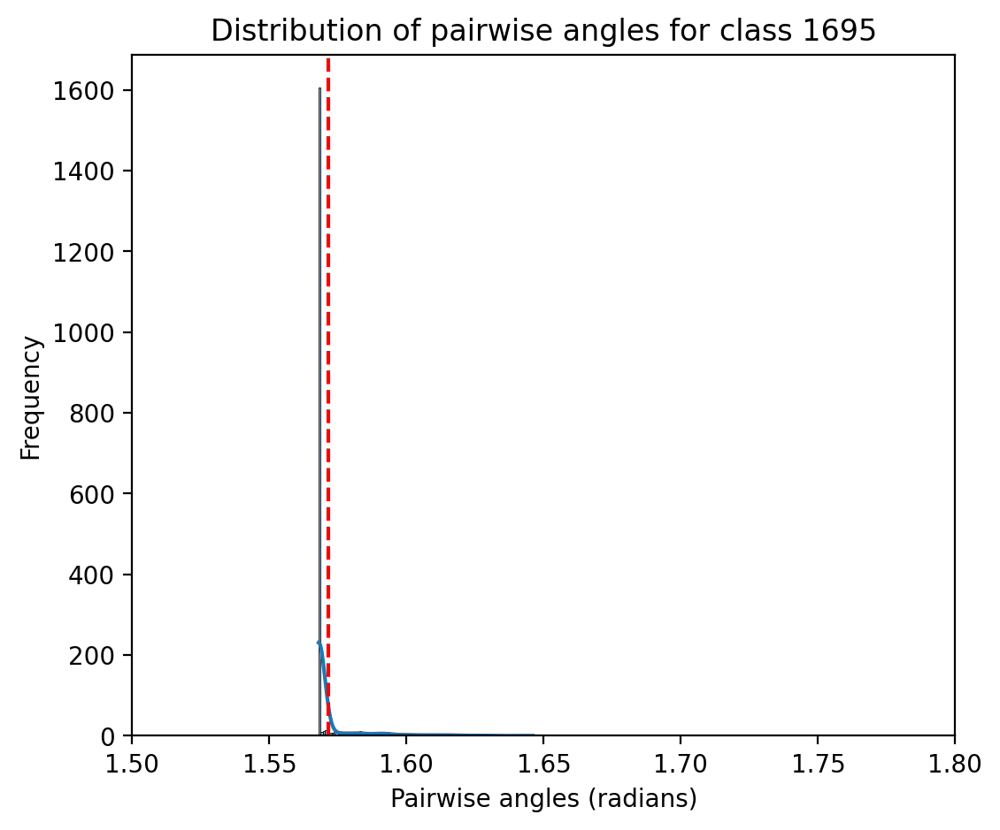

In [9]:
# investigate class 1695
target_class = 1695

# get the 1695 row without the 1695 column
target_pairwise_angles = angles[target_class][torch.arange(angles.size(0)) != target_class]
print(f'target class pairwise angles: max: {target_pairwise_angles.max()}, min: {target_pairwise_angles.min()}, mean: {target_pairwise_angles.mean()}, std: {target_pairwise_angles.std()}')

# draw the distribution of the pairwise angles of class 1695
plt.figure(dpi=200, figsize=(6, 5))
sns.histplot(target_pairwise_angles, bins=100, kde=True)
plt.axvline(torch.acos(torch.tensor(-1/1919)), color='r', linestyle='--')
plt.xlabel('Pairwise angles (radians)')
plt.ylabel('Frequency')
plt.title('Distribution of pairwise angles for class 1695')
plt.xlim(1.5, 1.8)
plt.show()

In [10]:
# investigate the angles between train embeddings and means, especially class 1695
from utils.losses import pairwise_cosine_distance

cos_dist = pairwise_cosine_distance(train_embeddings, means)
print(cos_dist.shape)
print(f'class 1695: {label_list[1695]}')
n_train = len(train_embeddings)
n_correct = 0
for i in range(n_train):
    label = train_labels[i]
    label_idx = label2idx[label]
    nearest_mean_idx = torch.argmin(cos_dist[i])
    nearest_mean_label = label_list[nearest_mean_idx]
    dist_label = cos_dist[i, label_idx]
    # get the rank of cos_dist[i, label_idx] in cos_dist[i] in ascending order
    value_of_interest = cos_dist[i, label_idx]
    # Count how many values are less than the value of interest in the i-th row.
    rank = torch.sum(cos_dist[i] < value_of_interest).item()
    correct = nearest_mean_label == label
    n_correct += int(correct)
    print(f'{i}\t{correct}\t{label}->{nearest_mean_label}\tgt label rank: {rank}')
print(f'accuracy: {n_correct/n_train}')

torch.Size([167108, 1920])
class 1695: 5.2.1.8
0	True	3.2.2.6->3.2.2.6	gt label rank: 0
1	True	3.2.1.39->3.2.1.39	gt label rank: 0
2	True	3.1.1.74->3.1.1.74	gt label rank: 0
3	True	3.2.1.91->3.2.1.91	gt label rank: 0
4	True	2.7.7.108->2.7.7.108	gt label rank: 0
5	True	2.5.1.54->2.5.1.54	gt label rank: 0
6	True	2.5.1.54->2.5.1.54	gt label rank: 0
7	True	2.4.1.207->2.4.1.207	gt label rank: 0
8	True	2.4.1.207->2.4.1.207	gt label rank: 0
9	True	2.4.1.207->2.4.1.207	gt label rank: 0
10	True	3.2.1.14->3.2.1.14	gt label rank: 0
11	True	2.7.11.1->2.7.11.1	gt label rank: 0
12	True	1.14.14.1->1.14.14.1	gt label rank: 0
13	True	1.1.1.41->1.1.1.41	gt label rank: 0
14	True	1.1.1.34->1.1.1.34	gt label rank: 0
15	True	1.1.1.34->1.1.1.34	gt label rank: 0
16	True	3.1.1.117->3.1.1.117	gt label rank: 0
17	True	2.7.11.1->2.7.11.1	gt label rank: 0
18	True	3.4.24.11->3.4.24.11	gt label rank: 0
19	True	2.3.1.199->2.3.1.199	gt label rank: 0
20	True	5.4.99.5->5.4.99.5	gt label rank: 0
21	True	2.3.1.12->2.3.1.1

/work/jiaqi/software/miniconda3/envs/protein/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/work/jiaqi/software/miniconda3/envs/protein/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


train_intra_class_var: max: 216.51159297026598, min: 29.842384591887267
train_intra_class_cosine: max: 0.743223534949506, min: 0.5743158608675003
train_intra_class_var <10 minor classes: max: 73.1344348362514, min: 32.35782368977865
train_intra_class_cosine <10 minor classes: max: 0.7337057931082589, min: 0.5743158608675003


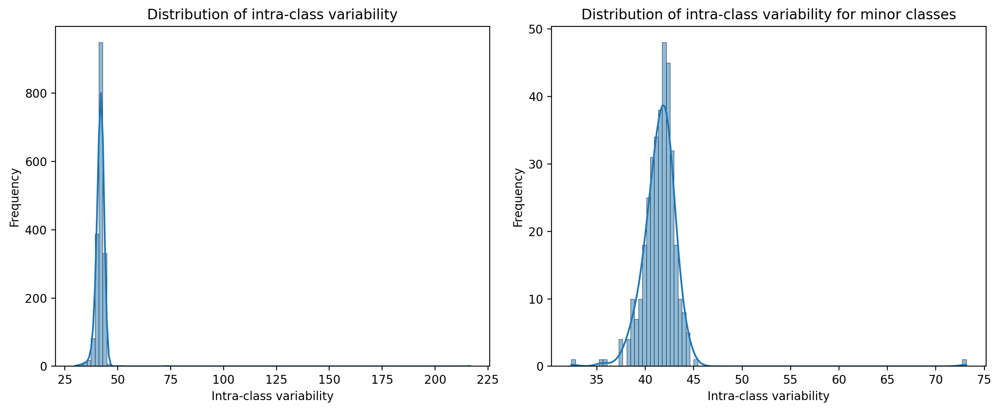

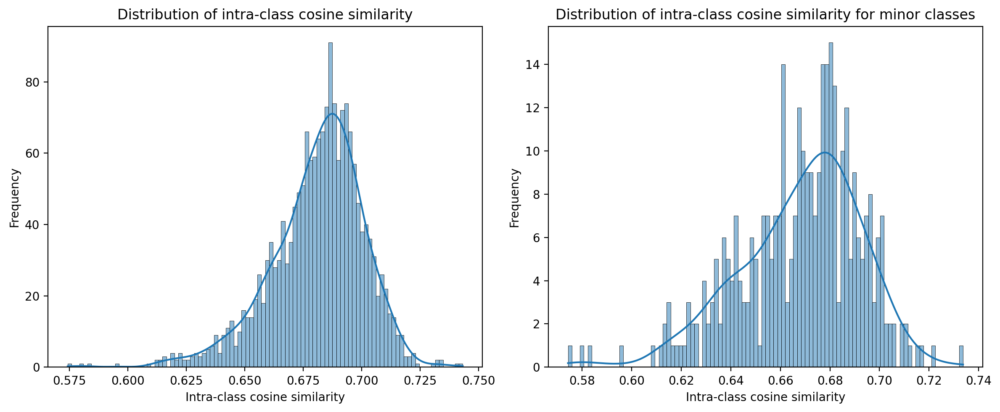

In [11]:
# investigate NC1 especially for minor classes
import torch.nn.functional as F
# var(||h_i-\mu_k||)
train_label2intra_class_var = {label: [] for label in label_list}
train_label2intra_class_cosine = {label: [] for label in label_list}
train_embeddings_normed = F.normalize(train_embeddings, p=2, dim=1)
n_train = len(train_embeddings)
for i in range(n_train):
    label = train_labels[i]
    train_label2intra_class_var[label].append(torch.norm(train_embeddings[i] - means[label2idx[label]], p=2).item())
    train_label2intra_class_cosine[label].append(F.cosine_similarity(train_embeddings[i], means[label2idx[label]], dim=0).item())
train_label2intra_class_var = {label: np.mean(var) for label, var in train_label2intra_class_var.items()}
train_intra_class_var = list(train_label2intra_class_var.values())
print(f'train_intra_class_var: max: {max(train_intra_class_var)}, min: {min(train_intra_class_var)}')
train_label2intra_class_cosine = {label: np.mean(cosine) for label, cosine in train_label2intra_class_cosine.items()}
train_intra_class_cosine = list(train_label2intra_class_cosine.values())
print(f'train_intra_class_cosine: max: {max(train_intra_class_cosine)}, min: {min(train_intra_class_cosine)}')

le10_train_label2intra_class_var = {label: train_label2intra_class_var[label] for label in label_list if ec2occurance[label] < 10}
# print(len(le10_train_label2intra_class_var))
le10_train_intra_class_var = list(le10_train_label2intra_class_var.values())
print(f'train_intra_class_var <10 minor classes: max: {max(le10_train_intra_class_var)}, min: {min(le10_train_intra_class_var)}')
le10_train_label2intra_class_cosine = {label: train_label2intra_class_cosine[label] for label in label_list if ec2occurance[label] < 10}
le10_train_intra_class_cosine = list(le10_train_label2intra_class_cosine.values())
print(f'train_intra_class_cosine <10 minor classes: max: {max(le10_train_intra_class_cosine)}, min: {min(le10_train_intra_class_cosine)}')

# plot the distribution of the intra-class variance
figures, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), dpi=200)
sns.histplot(train_intra_class_var, ax=axes[0], bins=100, kde=True)
axes[0].set_xlabel('Intra-class variability')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of intra-class variability')

sns.histplot(le10_train_intra_class_var, ax=axes[1], bins=100, kde=True)
axes[1].set_xlabel('Intra-class variability')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Distribution of intra-class variability for minor classes')

plt.tight_layout()
plt.show()

# plot the distribution of the intra-class cosine similarity
figures, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), dpi=200)
sns.histplot(train_intra_class_cosine, ax=axes[0], bins=100, kde=True)
axes[0].set_xlabel('Intra-class cosine similarity')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of intra-class cosine similarity')

sns.histplot(le10_train_intra_class_cosine, ax=axes[1], bins=100, kde=True)
axes[1].set_xlabel('Intra-class cosine similarity')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Distribution of intra-class cosine similarity for minor classes')

plt.tight_layout()
plt.show()

In [29]:
# investigate all the wrong predictions in minor classes

n_test = len(test_embeddings)
wrong_preds = []
correct_preds = []
for i in range(n_test):
    if test_labels[i] != test_preds[i]:
        wrong_preds.append((test_embeddings[i], test_labels[i], test_preds[i]))
    else:
        correct_preds.append((test_embeddings[i], test_labels[i], test_preds[i]))
le10_wrong_preds = [pred for pred in wrong_preds if ec2occurance[pred[1]] < 10]
le10_correct_preds = [pred for pred in correct_preds if ec2occurance[pred[1]] < 10]
num_le10 = 0
for i in range(n_test):
    if ec2occurance[test_labels[i]] < 10:
        num_le10 += 1
print(len(le10_wrong_preds), len(le10_correct_preds), num_le10, len(wrong_preds), len(correct_preds), n_test)
for i, (emb, label, pred) in enumerate(le10_wrong_preds):
    pred_mean = means[label2idx[pred]]
    gt_mean = means[label2idx[label]]
    # dist_with_pred_mean = torch.norm(emb - pred_mean, p=2).item()
    # dist_with_gt_mean = torch.norm(emb - gt_mean, p=2).item()
    dist_with_pred_mean = F.cosine_similarity(emb, pred_mean, dim=0).item()
    dist_with_gt_mean = F.cosine_similarity(emb, gt_mean, dim=0).item()
    norm_emb = torch.norm(emb, p=2).item()
    print(f'{i}: label: {label} ({ec2occurance[label]}), pred: {pred} ({ec2occurance[pred]}), dist_with_pred_mean: {dist_with_pred_mean}, dist_with_gt_mean: {dist_with_gt_mean}, pred-gt: {dist_with_pred_mean - dist_with_gt_mean}, norm_emb: {norm_emb}')

42 862 904 153 20736 20889
0: label: 1.14.15.24 (7), pred: 1.14.19.20 (18), dist_with_pred_mean: 0.3076092600822449, dist_with_gt_mean: 0.2554619610309601, pred-gt: 0.05214729905128479, norm_emb: 0.12639747560024261
1: label: 1.1.1.81 (2), pred: 2.7.1.31 (5), dist_with_pred_mean: 0.6052972078323364, dist_with_gt_mean: 0.015504430048167706, pred-gt: 0.5897927777841687, norm_emb: 0.2888035476207733
2: label: 3.1.4.58 (1), pred: 3.1.4.37 (7), dist_with_pred_mean: 0.13646963238716125, dist_with_gt_mean: 0.13154515624046326, pred-gt: 0.004924476146697998, norm_emb: 0.07548749446868896
3: label: 4.1.2.43 (3), pred: 4.1.3.17 (3), dist_with_pred_mean: 0.23937641084194183, dist_with_gt_mean: 0.06479521095752716, pred-gt: 0.17458119988441467, norm_emb: 0.0653827115893364
4: label: 1.2.7.7 (5), pred: 1.2.7.1 (9), dist_with_pred_mean: 0.6425634622573853, dist_with_gt_mean: 0.019161706790328026, pred-gt: 0.6234017554670572, norm_emb: 2.343573570251465
5: label: 1.2.7.7 (5), pred: 1.2.7.1 (9), dist_

In [13]:
# investigate all the wrong predictions in minor classes in trainset

n_train = len(train_embeddings)
wrong_preds = []
correct_preds = []
for i in range(n_train):
    if train_labels[i] != train_preds[i]:
        wrong_preds.append((train_embeddings[i], train_labels[i], train_preds[i]))
    else:
        correct_preds.append((train_embeddings[i], train_labels[i], train_preds[i]))
le10_wrong_preds = [pred for pred in wrong_preds if ec2occurance[pred[1]] < 10]
le10_correct_preds = [pred for pred in correct_preds if ec2occurance[pred[1]] < 10]
num_le10 = 0
for i in range(n_train):
    if ec2occurance[train_labels[i]] < 10:
        num_le10 += 1
print(len(le10_wrong_preds), len(le10_correct_preds), num_le10, len(wrong_preds), len(correct_preds), n_train)
for i, (emb, label, pred) in enumerate(le10_wrong_preds):
    pred_mean = means[label2idx[pred]]
    gt_mean = means[label2idx[label]]
    dist_with_pred_mean = torch.norm(emb - pred_mean, p=2).item()
    dist_with_gt_mean = torch.norm(emb - gt_mean, p=2).item()
    print(f'{i}: label: {label} ({ec2occurance[label]}), pred: {pred} ({ec2occurance[pred]}), dist_with_pred_mean: {dist_with_pred_mean:.4f}, dist_with_gt_mean: {dist_with_gt_mean:.4f}, pred-gt: {dist_with_pred_mean - dist_with_gt_mean:.4f}')

1839 2 1841 167106 2 167108
0: label: 3.1.1.101 (1), pred: 2.1.1.183 (15), dist_with_pred_mean: 44.9905, dist_with_gt_mean: 42.4658, pred-gt: 2.5247
1: label: 4.2.3.114 (6), pred: 1.1.1.26 (4), dist_with_pred_mean: 45.8164, dist_with_gt_mean: 39.6822, pred-gt: 6.1343
2: label: 2.5.1.81 (4), pred: 4.2.2.23 (15), dist_with_pred_mean: 45.9560, dist_with_gt_mean: 42.2631, pred-gt: 3.6929
3: label: 2.1.1.364 (9), pred: 1.11.1.26 (29), dist_with_pred_mean: 44.7947, dist_with_gt_mean: 42.4021, pred-gt: 2.3926
4: label: 3.1.3.27 (8), pred: 5.3.1.14 (61), dist_with_pred_mean: 45.2988, dist_with_gt_mean: 42.2293, pred-gt: 3.0696
5: label: 4.2.3.133 (4), pred: 6.2.1.48 (26), dist_with_pred_mean: 45.3041, dist_with_gt_mean: 40.6563, pred-gt: 4.6478
6: label: 1.1.98.2 (8), pred: 2.7.7.75 (2), dist_with_pred_mean: 44.4950, dist_with_gt_mean: 42.7618, pred-gt: 1.7332
7: label: 3.6.1.58 (5), pred: 2.1.1.176 (84), dist_with_pred_mean: 44.8838, dist_with_gt_mean: 41.2104, pred-gt: 3.6734
8: label: 1.14.

In [14]:
# investigate all the correct predictions in minor classes in testset

n_test = len(test_embeddings)
wrong_preds = []
correct_preds = []
for i in range(n_test):
    if test_labels[i] != test_preds[i]:
        wrong_preds.append((test_embeddings[i], test_labels[i], test_preds[i]))
    else:
        correct_preds.append((test_embeddings[i], test_labels[i], test_preds[i]))
le10_wrong_preds = [pred for pred in wrong_preds if ec2occurance[pred[1]] < 10]
le10_correct_preds = [pred for pred in correct_preds if ec2occurance[pred[1]] < 10]
num_le10 = 0
for i in range(n_test):
    if ec2occurance[test_labels[i]] < 10:
        num_le10 += 1
print(len(le10_wrong_preds), len(le10_correct_preds), num_le10, len(wrong_preds), len(correct_preds), n_test)
for i, (emb, label, pred) in enumerate(le10_correct_preds):
    pred_mean = means[label2idx[pred]]
    gt_mean = means[label2idx[label]]
    dist_with_pred_mean = torch.norm(emb - pred_mean, p=2).item()
    dist_with_gt_mean = torch.norm(emb - gt_mean, p=2).item()
    # get the nearest distance between emb and means
    dist_with_nearest_mean = torch.min(torch.norm(emb - means, p=2, dim=1)).item()
    # get the nearest index
    nearest_idx = torch.argmin(torch.norm(emb - means, p=2, dim=1)).item()
    nearest_label = label_list[nearest_idx]
    print(f'{i}: label: {label} ({ec2occurance[label]}), nearest label: {nearest_label} ({ec2occurance[nearest_label]}), dist_with_nearest_mean: {dist_with_nearest_mean:.4f}, dist_with_gt_mean: {dist_with_gt_mean:.4f}, nearest-gt: {dist_with_nearest_mean - dist_with_gt_mean:.4f}')

904 0 904 20889 0 20889


In [15]:
dist_mat = torch.cdist(means, means, p=2)
# get max, min, mean, std of dist_mat ignoring the diagonal elements
max_dist = torch.max(dist_mat[torch.eye(dist_mat.size(0)) == 0])
min_dist = torch.min(dist_mat[torch.eye(dist_mat.size(0)) == 0])
mean_dist = torch.mean(dist_mat[torch.eye(dist_mat.size(0)) == 0])
std_dist = torch.std(dist_mat[torch.eye(dist_mat.size(0)) == 0])
print(f'max_dist: {max_dist}, min_dist: {min_dist}, mean_dist: {mean_dist}, std_dist: {std_dist}')

mean_norms = torch.norm(means, p=2, dim=1)
print(mean_norms.shape)
print(f'max_mean_norm: {torch.max(mean_norms)}, min_mean_norm: {torch.min(mean_norms)}, mean_mean_norm: {torch.mean(mean_norms)}, std_mean_norm: {torch.std(mean_norms)}')

max_dist: 68.6877212524414, min_dist: 60.343875885009766, mean_dist: 63.30064010620117, std_dist: 0.7706723213195801
torch.Size([1920])
max_mean_norm: 46.955326080322266, min_mean_norm: 42.69332504272461, mean_mean_norm: 44.7845344543457, std_mean_norm: 0.6991103291511536


In [16]:
# calculate NC1 Loss
from utils.losses import NC1Loss
import torch.nn as nn

nc1_loss = NC1Loss(num_classes=len(label_list), feat_dim=means.size(1), device=device)
nc1_loss.means = nn.Parameter(means.to(device))

train_loss_list = []
with torch.no_grad():
    for emb, label in train_loader:
        label = label.to(device)
        output, feature = model(emb.to(device))
        loss, _ = nc1_loss(feature, label)
        train_loss_list.append(loss.item())
print(f'train_loss: mean: {np.mean(train_loss_list)}, max: {np.max(train_loss_list)}, min: {np.min(train_loss_list)}, std: {np.std(train_loss_list)}')


train_loss: mean: 233.73334113538084, max: 385.88775634765625, min: 109.73715209960938, std: 49.08655933653335


In [17]:
# investigate the induced class means

induced_means = torch.vstack([train_label2mean[label] if label in train_label2mean else torch.randn(2000) for label in label_list])
print(induced_means.shape, len(train_label2mean))
induced_means_angles = get_pairwise_angle(induced_means)
# get the max and min and std of angles while ignoring the diagonal elements
max_angle = torch.max(induced_means_angles[torch.eye(induced_means_angles.size(0)) == 0])
min_angle = torch.min(induced_means_angles[torch.eye(induced_means_angles.size(0)) == 0])
std_angle = torch.std(induced_means_angles[torch.eye(induced_means_angles.size(0)) == 0])
print(f'induced means: max_angle: {max_angle}, min_angle: {min_angle}, std_angle: {std_angle}')

cos_sim_means_induced_means = F.cosine_similarity(means, induced_means, dim=1)
print(cos_sim_means_induced_means.shape)
print(f'cos_sim_means_induced_means: max: {torch.max(cos_sim_means_induced_means)}, min: {torch.min(cos_sim_means_induced_means)}, mean: {torch.mean(cos_sim_means_induced_means)}, std: {torch.std(cos_sim_means_induced_means)}')

# get the row by row dist between means and induced_means
dist_means_induced_means = (means - induced_means).norm(p=2, dim=1)
print(dist_means_induced_means.shape)
print(f'dist_means_induced_means: max: {torch.max(dist_means_induced_means)}, min: {torch.min(dist_means_induced_means)}, mean: {torch.mean(dist_means_induced_means)}, std: {torch.std(dist_means_induced_means)}')

torch.Size([1920, 2000]) 1795
induced means: max_angle: 2.1517505645751953, min_angle: 0.5481484532356262, std_angle: 0.06245111674070358
torch.Size([1920])
cos_sim_means_induced_means: max: 0.7453917860984802, min: -0.04847230017185211, mean: 0.6373029351234436, std: 0.16902141273021698
torch.Size([1920])
dist_means_induced_means: max: 206.90663146972656, min: 29.18168067932129, mean: 43.129207611083984, std: 6.758450031280518


In [18]:
k = 0
for i, (ec, occurance) in enumerate(ec2occurance.items()):
    if occurance == 0 and ec in test_labels:
        print(k, ec, ec in test_labels)
        k += 1

0 2.7.1.74 True
1 4.99.1.2 True


In [19]:
rand_means = torch.randn_like(means)
rand_means_angles = get_pairwise_angle(rand_means)
# get the max and min and std of angles while ignoring the diagonal elements
max_angle = torch.max(rand_means_angles[torch.eye(rand_means_angles.size(0)) == 0])
min_angle = torch.min(rand_means_angles[torch.eye(rand_means_angles.size(0)) == 0])
std_angle = torch.std(rand_means_angles[torch.eye(rand_means_angles.size(0)) == 0])
print(f'rand means: max_angle: {max_angle}, min_angle: {min_angle}, std_angle: {std_angle}')


rand means: max_angle: 1.6863007545471191, min_angle: 1.4648585319519043, std_angle: 0.0223584845662117


In [20]:
import torch
import os

# model_dir = '../logs_debug/train_mlp_single_label_NC_2024_03_07__12_20_13_NC1_cosine_10.0_1.0'
model_dir = '../logs_debug/train_mlp_single_label_NC_deeper_esm1b_2024_03_30__11_24_38_NC_v2_cosine_bs1000'
# model_dir = '../logs_analysis/train_mlp_single_label_NC_2024_03_01__14_42_37_0.0005_0.01'
means = torch.load(os.path.join(model_dir, 'checkpoints/means.pt')).detach().cpu()
norm_ = torch.norm(means, p=2, dim=1)
print(norm_)
rand_means = torch.randn_like(means)
rand_norm_ = torch.norm(rand_means, p=2, dim=1)
print(rand_norm_)

tensor([46.4981, 45.1105, 43.7830,  ..., 44.6010, 44.6879, 45.4132])
tensor([44.4309, 46.8663, 46.2418,  ..., 43.8576, 45.1290, 44.1576])


In [21]:
max(mean_norms), min(mean_norms), torch.mean(mean_norms), torch.std(mean_norms)

(tensor(46.9553), tensor(42.6933), tensor(44.7845), tensor(0.6991))

In [22]:
means[label2idx['4.2.3.106']], norm_[label2idx['4.2.3.106']]

(tensor([ 0.5590,  0.0402, -0.9920,  ...,  0.8955,  0.3950,  0.3356]),
 tensor(43.7742))

tensor(314.7767) tensor(0.0300) tensor(5.0626) tensor(14.7587)
tensor(20889)
[2.7600321769714355, 6.4673848152160645, 3.2998862266540527, 5.031031608581543, 7.486512184143066, 4.591322422027588, 3.220592975616455, 3.8502490520477295, 3.030808925628662, 1.449424147605896, 5.413516998291016, 7.788565158843994, 3.8956477642059326, 3.1091830730438232, 3.0889906883239746, 2.993544101715088, 4.696137428283691, 5.041665554046631, 3.277783155441284, 2.9505491256713867, 2.401824951171875, 5.090121746063232, 6.127663612365723, 4.9250640869140625, 4.050311088562012, 2.434638738632202, 1.7146313190460205, 4.941077709197998, 5.4841413497924805, 3.033118963241577, 2.0033462047576904, 3.444653034210205, 3.1041762828826904, 5.054401874542236, 3.3060812950134277, 4.661192417144775, 4.558501243591309, 2.642313241958618, 2.7523694038391113, 7.465033531188965, 4.924499988555908, 4.6763153076171875, 6.758840560913086, 4.677307605743408, 3.533964157104492, 3.376917600631714, 7.959259986877441, 1.95941960811

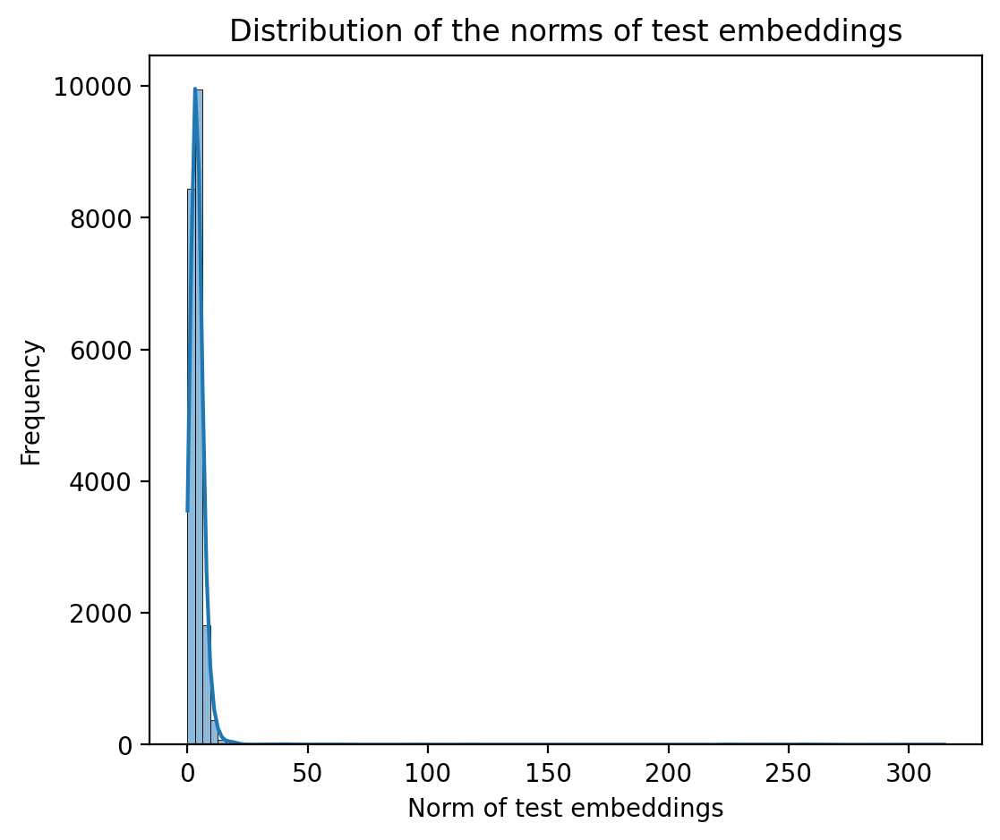

In [23]:
test_emb_norms = torch.norm(test_embeddings, p=2, dim=1)
print(max(test_emb_norms), min(test_emb_norms), torch.mean(test_emb_norms), torch.std(test_emb_norms))
print((test_emb_norms >0).sum())
print(test_emb_norms.tolist())
# plot the distribution of the norms of the test embeddings
plt.figure(dpi=200, figsize=(6, 5))
sns.histplot(test_emb_norms, bins=100, kde=True)
plt.xlabel('Norm of test embeddings')
plt.ylabel('Frequency')
plt.title('Distribution of the norms of test embeddings')
plt.show()

In [24]:
import sys
sys.path.append('..')
def pairwise_cosine_distance(x, y):
    '''
    x: (N, D)
    y: (M, D)
    return: (N, M)
    '''
    # print(f'norm x: {x.norm(dim=1, keepdim=True)}')
    # print(f'norm y: {y.norm(dim=1, keepdim=True)}')
    # Normalize x and y to have unit norm
    x_norm = x / (x.norm(dim=1, keepdim=True) + 1e-10)
    y_norm = y / (y.norm(dim=1, keepdim=True) + 1e-10)

    # Compute the cosine similarity
    cosine_similarity = torch.mm(x_norm, y_norm.t())

    # Compute the cosine distance
    cosine_distance = 1 - cosine_similarity
    
    return cosine_distance
cos_sim = pairwise_cosine_distance(test_embeddings, means)
print(cos_sim)
preds = cos_sim.argmin(dim=1)
print(preds, preds.shape)

tensor([[0.9927, 0.9990, 0.9896,  ..., 0.9889, 0.9943, 1.0028],
        [0.9841, 1.0148, 0.9835,  ..., 0.9873, 0.9659, 1.0031],
        [0.9932, 1.0062, 0.9791,  ..., 0.9890, 0.9789, 0.9613],
        ...,
        [0.9799, 0.9867, 0.9773,  ..., 0.9845, 0.9632, 0.9815],
        [0.9715, 1.0103, 0.9800,  ..., 0.9961, 0.9819, 0.9762],
        [0.9917, 0.9980, 0.9910,  ..., 0.9895, 0.9965, 1.0044]])
tensor([1065,  409, 1776,  ...,  980, 1461, 1065]) torch.Size([20889])


In [27]:
n = 0
for label in test_labels:
    if ec2occurance[label] < 10:
        n += 1
print(n)

904
